## Build CART model using Python

### 1) Import required Libraries

In [1]:
import pandas                   as      pd
import numpy                    as      np
import sklearn.datasets         as      datasets
import matplotlib.pyplot        as      plt

from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
from   sklearn.tree             import _tree

from   sklearn                  import  metrics 
from   sklearn.metrics          import  classification_report
from   sklearn.metrics          import  confusion_matrix
from   sklearn.metrics          import  roc_curve, auc
from   sklearn.model_selection  import  KFold 
from   six                      import  StringIO
import seaborn                  as      sns
import matplotlib.pyplot        as      plt

from   sklearn.model_selection  import  train_test_split
from   sklearn.model_selection  import  cross_val_score, KFold

import pydotplus
import pydot

%matplotlib inline

In [2]:
### To get optimum maximum depth
from sklearn.model_selection import  ParameterGrid, GridSearchCV
from sklearn.metrics         import  make_scorer, accuracy_score, classification_report
from sklearn.tree            import  plot_tree

In [3]:
def measures_cm(act, pred):
   
    c_matrix = pd.crosstab(act,pred, rownames=['Actual'], colnames=['Predicted'])

    sns.heatmap(c_matrix, annot = True, fmt = '.6g')
    plt.show()
    target_names = [ 'Healthy', 'NPA']
    print(classification_report(act, pred, target_names = target_names))

In [4]:
def draw_roc( actual, probs ):

    import pandas            as   pd
    import numpy             as   np
    import seaborn           as   sns
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
    drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [5]:
def decision_tree_no_pruning(model, X, y, flist, file_name):
    from sklearn.tree            import export_graphviz
    from   six                   import StringIO
    from IPython.core.pylabtools import figsize
    from IPython.display         import Image
    figsize(12.5, 6)
    import pydot

    #dot_data = StringIO()  
    file_name_dot = file_name + '.dot'
    file_name_png = file_name + '.png'
    
    export_graphviz(model, out_file = file_name_dot, feature_names = flist,\
                    class_names = ['Healthy','NPA'],
                    filled = True, rounded = True)
    (graph,) = pydot.graph_from_dot_file(file_name_dot)
    graph.write_png(file_name_png)
    return Image(file_name_png)

In [6]:
def decision_tree_with_pruning(clf, X, y, flist, file_name):
    from sklearn.tree            import export_graphviz
    from   six                   import StringIO
    from IPython.core.pylabtools import figsize
    from IPython.display         import Image
    figsize(12.5, 6)
    import pydot
    #dot_data = StringIO()  
    file_name_dot = file_name + '.dot'
    file_name_png = file_name + '.png'
    
    export_graphviz(clf, out_file = file_name_dot, feature_names = flist,
                    class_names = ['Healthy','NPA'],
                    filled = True, rounded = True)
    (graph,) = pydot.graph_from_dot_file(file_name_dot)
    graph.write_png(file_name_png)
    return Image(file_name_png)

In [7]:
'''
This function returns a set of rules defined in the Decision Tree which is easy to understand
'''
def tree_to_rules(tree, feature_names, class_names):

    left = tree.tree_.children_left
    right = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth=0):

        indent = "  " * depth

        if (threshold[node] != -2):

            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")

            if left[node] != -1:

                recurse (left, right, threshold, features, left[node], depth+1)
                print(indent,"} else {")

                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)

                print(indent,"}")

        else:
            if value[node][0,0] > value[node][0,1]:
              classified = class_names[0]
            else:
              classified = class_names[1]
            print(indent,"Class = " + classified)
    recurse(left, right, threshold, features, 0)

In [8]:
'''
This function calculates the Youdens J score which gives the optimum cut-off
point given the fpr, tpr and thresholds
'''
def get_youdens_j_cutoff(fpr,tpr,thresholds):
    j_scores = tpr-fpr
    j_ordered = sorted(zip(j_scores,thresholds))
    return j_ordered[-1][1]

In [9]:
import   os
folder =  r'D:\DrPKV\20220901\Output_20220901041153PM'
os.chdir(folder)
print(os.getcwd())

D:\DrPKV\20220901\Output_20220901041153PM


In [10]:
file_train           =   'train_20220901041153PM.csv'
file_test            =   'test_20220901041153PM.csv'

In [11]:
df_train              =    pd.read_csv(file_train)
print('Data shape {}'.format(df_train.shape))
print(df_train.columns)

Data shape (6300, 16)
Index(['Cash_ratio', 'Changeinsales_Industry', 'debt_equity', 'debt_income',
       'Interest_coverage', 'Operating Cash Flow/Total Debt',
       'Receivable_turnover(new)', 'ROS(new)', 'Total shareholders' funds',
       'Slno', 'Shareholderquity_code', 'Target', 'y_train_pred_CART',
       'y_train_pred_RF', 'y_train_pred_XGB', 'y_train_pred_Consensus'],
      dtype='object')


In [12]:
df_test              =    pd.read_csv(file_test)
print('Data shape {}'.format(df_test.shape))
print(df_test.columns)

Data shape (2700, 16)
Index(['Cash_ratio', 'Changeinsales_Industry', 'debt_equity', 'debt_income',
       'Interest_coverage', 'Operating Cash Flow/Total Debt',
       'Receivable_turnover(new)', 'ROS(new)', 'Total shareholders' funds',
       'Slno', 'Shareholderquity_code', 'Target', 'y_test_pred_CART',
       'y_test_pred_RF', 'y_test_pred_XGB', 'y_test_pred_Consensus'],
      dtype='object')


In [13]:
feature_names =  ['Cash_ratio', 'Changeinsales_Industry', 'debt_equity', 'debt_income','Interest_coverage',\
                  'Operating Cash Flow/Total Debt', 'Receivable_turnover(new)', 'ROS(new)', "Total shareholders' funds" ]

In [14]:
print(feature_names)

['Cash_ratio', 'Changeinsales_Industry', 'debt_equity', 'debt_income', 'Interest_coverage', 'Operating Cash Flow/Total Debt', 'Receivable_turnover(new)', 'ROS(new)', "Total shareholders' funds"]


In [15]:
X_train       =  df_train.loc[:,feature_names]
y_train       =  df_train.loc[:,'Target']

In [16]:
X_test         =  df_test.loc[:,feature_names]
y_test         =  df_test.loc[:,'Target']
label_names    =  y_test.unique()
print(label_names)

[1 0]


In [17]:
label_names    =  ['Healthy', 'NPA']

In [18]:
clf    = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf    = clf.fit(X_train, y_train)

In [19]:
decision_tree_no_pruning(clf, y_train, y_train, feature_names, 'Target')

### Prune the Tree

To get an idea of what values of ccp_alpha will work to reduce the tree size, scikit-learn provides a functioncost_complexity_pruning_path that returns the effective alphas and the corresponding total leaf impurities at each step of the pruning process.

https://towardsdatascience.com/build-better-decision-trees-with-pruning-8f467e73b107

In [20]:
max_depth                 =     clf.get_depth()
print(max_depth)

### Perform Grid Search

max_depth_grid_search      =     GridSearchCV(estimator = DecisionTreeClassifier(random_state = 12345),\
scoring = make_scorer(accuracy_score), param_grid = \
ParameterGrid({'max_depth' : [[max_depth] for max_depth in range(1, max_depth + 1 )]}),)

23


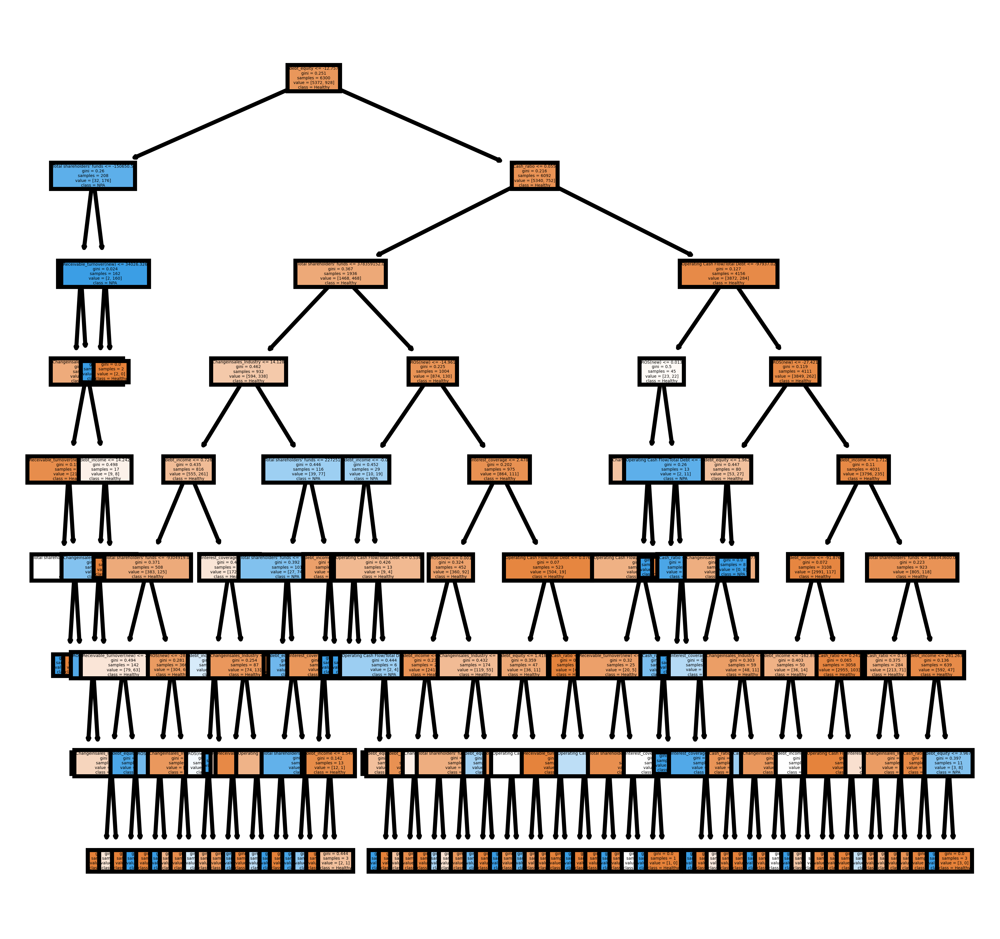

In [21]:
max_depth_grid_search.fit(X_train,y_train)
max_depth_grid_search.best_params_
best_max_depth_tree  = max_depth_grid_search.best_estimator_
best_max_depth       = best_max_depth_tree

plt.figure(figsize = (4, 4), dpi = 1000)
plot_tree(
    best_max_depth_tree,
    feature_names = feature_names,
    class_names   = label_names,
    filled = True,
)
plt.show()

In [22]:
best_max_depth

DecisionTreeClassifier(max_depth=8, random_state=12345)

In [23]:
### Decision Tree Classifier 
clf1    = DecisionTreeClassifier(max_depth = 5, random_state = 12345).fit(X_train,y_train)

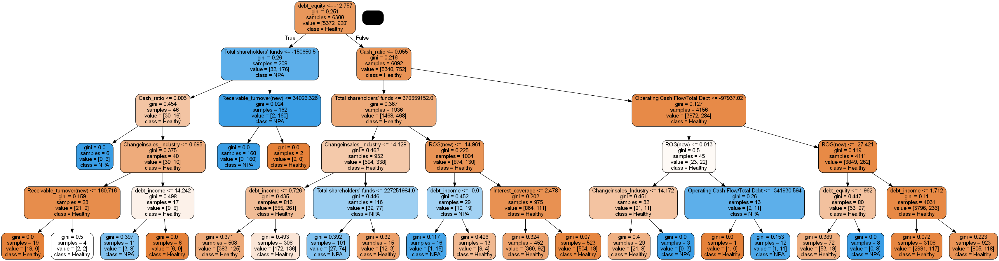

In [24]:
decision_tree_with_pruning(clf1, X_train, y_train, feature_names, 'Target')

In [25]:
class_names  =  ['Solvant', 'NPA']

In [26]:
tree_to_rules(clf1, list(X_train.loc[:,feature_names]), class_names)

 if ( debt_equity <= -12.757390975952148 ) {
   if ( Total shareholders' funds <= -150650.5 ) {
     if ( Cash_ratio <= 0.005304956343024969 ) {
       Class = NPA
     } else {
       if ( Changeinsales_Industry <= 0.6953547894954681 ) {
         if ( Receivable_turnover(new) <= 160.7162322998047 ) {
           Class = Solvant
         } else {
           Class = NPA
         }
       } else {
         if ( debt_income <= 14.242411136627197 ) {
           Class = NPA
         } else {
           Class = Solvant
         }
       }
     }
   } else {
     if ( Receivable_turnover(new) <= 34026.326171875 ) {
       Class = NPA
     } else {
       Class = Solvant
     }
   }
 } else {
   if ( Cash_ratio <= 0.05487825535237789 ) {
     if ( Total shareholders' funds <= 378359152.0 ) {
       if ( Changeinsales_Industry <= 14.128055095672607 ) {
         if ( debt_income <= 0.7259111702442169 ) {
           Class = Solvant
         } else {
           Class = Solvant
         }
       } e

In [27]:
clf1    =   DecisionTreeClassifier(criterion="entropy", max_depth = 5, min_impurity_decrease = 0)
clf1.fit(X_train, y_train)
#Predict the response for train dataset
predicted_train = clf1.predict(X_train)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_train, predicted_train))

Accuracy: 0.8896825396825396


In [28]:
clf1

DecisionTreeClassifier(criterion='entropy', max_depth=5,
                       min_impurity_decrease=0)

In [29]:
measures_train     = classification_report(y_train, predicted_train) 
print("\nTraining data")
print(measures_train) 


Training data
              precision    recall  f1-score   support

           0       0.89      0.99      0.94      5372
           1       0.83      0.31      0.46       928

    accuracy                           0.89      6300
   macro avg       0.86      0.65      0.70      6300
weighted avg       0.88      0.89      0.87      6300



<function matplotlib.pyplot.show(close=None, block=None)>

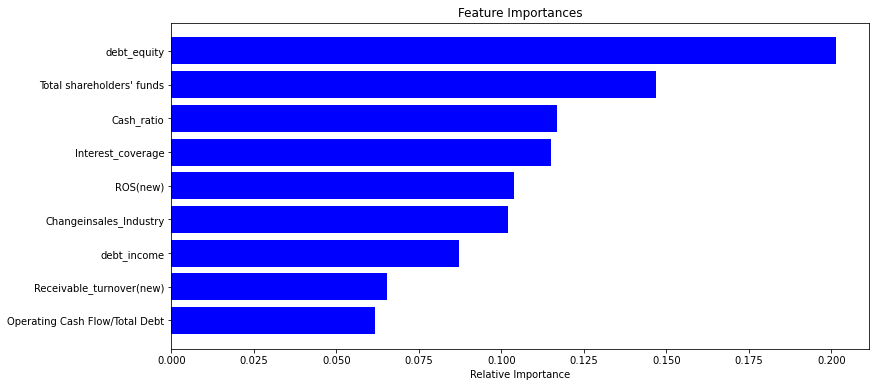

In [30]:
importances = clf.feature_importances_
indices     = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show

In [31]:
idf =  pd.DataFrame({'Name' : [feature_names[i] for i in indices], 'Value' : importances[indices] *100 })

In [32]:
idf.sort_values('Value', ascending = False, inplace = True)
idf.set_index(keys = 'Name', inplace = True)

In [33]:
idf

,Value
Name,
debt_equity,20.129169
Total shareholders' funds,14.673890
Cash_ratio,11.672588
Interest_coverage,11.505695
ROS(new),10.396881
Changeinsales_Industry,10.198216
debt_income,8.707051
Receivable_turnover(new),6.543593
Operating Cash Flow/Total Debt,6.172917


Decision trees (CART) offer importance scores based on the reduction in the criterion used to select split points based on entropy.